/home/u4/csmi/2024/sarr/feelpp-scimba/.venv/lib/python3.10/site-packages/pandas/core/arrays/masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


Using device: cpu


/home/u4/csmi/2024/sarr/feelpp-scimba/.venv/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


torch loaded; device is cpu


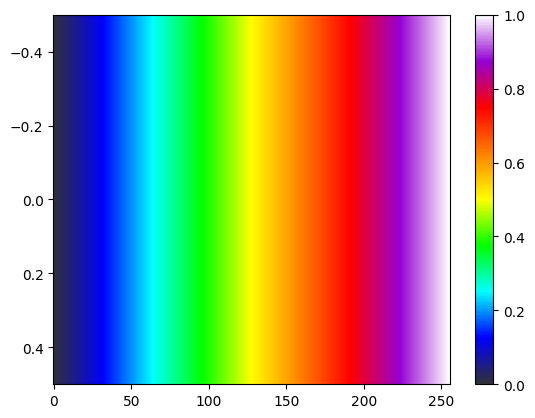

[ Starting Feel++ ] application feelpp_app version 0.1 date 2025-May-15
[feelpp] create Feel++ root repository: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb

[feelpp] create Feel++ geo repository: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/geo

[feelpp] create Feel++ results directory: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1

[feelpp] create Feel++ expressions directory: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/exprs

[feelpp] create Feel++ logs directory: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/logs

 . feelpp_app files are stored in /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1
 .. logfiles :/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/logs


In [1]:
import sys
import feelpp.core as fppc
import feelpp.toolboxes.core as tb
import pandas as pd
import numpy as np
from feelpp.scimba.Poisson import Poisson, runLaplacianPk, runConvergenceAnalysis, plot_convergence,plot_scimba_convergence, custom_cmap

sys.argv = ["feelpp_app"]
e = fppc.Environment(sys.argv,
                       opts=tb.toolboxes_options("coefficient-form-pdes", "cfpdes"),
                       config=fppc.localRepository('feelpp_cfpde'))

# ------------------------------------------------------------------------- #
# Poisson problem
# - div (diff * grad (u)) = f    in Omega
#                     u   = g    in Gamma_D
# Omega = domain, either cube or ball
# Approx = lagrange Pk of order order
# mesh of size h

P = Poisson(dim = 2)



Solving the laplacian problem for h = 0.05...
generate mesh omega-2.geo with h=0.05 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.05 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +----------------------------------------------------------------------------------------------------+                                             |
| | Environment                       

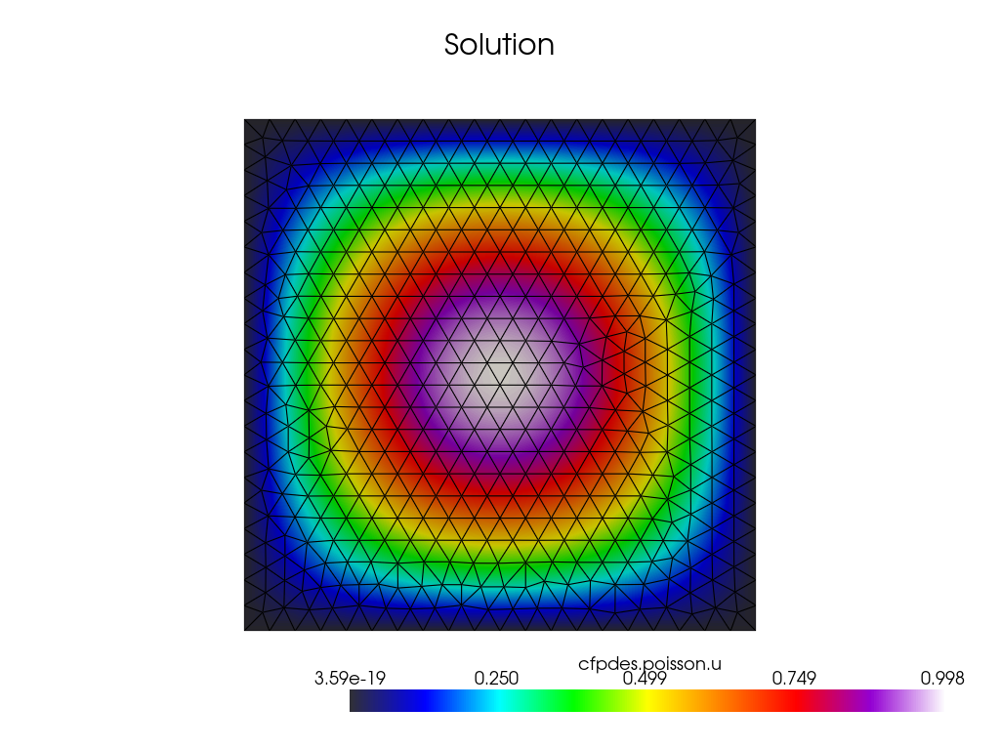

Solving the laplacian problem for h = 0.1...
generate mesh omega-2.geo with h=0.1 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.1 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +----------------------------------------------------------------------------------------------------+                                             |
| | Environment                          

In [2]:

# for square domain

u_exact = 'sin(pi*x) * sin(pi*y)'
grad_u_exact='{pi*cos(pi*x)*sin(pi*y),pi*sin(pi*x)*cos(pi*y)}'
rhs = '2*pi*pi*sin(pi*x) * sin(pi*y)'

#P(rhs=rhs, g='0', solver ='scimba', u_exact = u_exact)
P(rhs=rhs, g='0', solver ='feelpp', u_exact = u_exact)


h= [0.1, 0.05, 0.025, 0.0125, 0.00625]
measures = []

for i in h:
  P(h=i, rhs=rhs, g='0', plot=None ,  u_exact = u_exact,grad_u_exact=grad_u_exact)
  measures.append(P.measures)

print(measures)

# Plotting the error convergence rates
poisson_json = P.model
df= runConvergenceAnalysis( P, json=poisson_json, measures=measures, dim=2, hs= h,verbose=True)
print('measures = ', measures)
fig= plot_convergence(P, df,dim=2)
fig.show()


In [ ]:
u_exact = 'sin(pi*x) * sin(pi*y)'
#grad_u_exact='{pi*cos(pi*x)*sin(pi*y),pi*sin(pi*x)*cos(pi*y)}'
rhs = '2*pi*pi*sin(pi*x) * sin(pi*y)'

P(rhs=rhs, g='0', solver ='scimba', u_exact = u_exact)
#P(rhs=rhs, g='0', solver ='feelpp', u_exact = u_exact)


Solving the laplacian problem for h = 0.05...
generate mesh omega-2.geo with h=0.05 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.05 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +----------------------------------------------------------------------------------------------------+                                             |
| | Environment                       

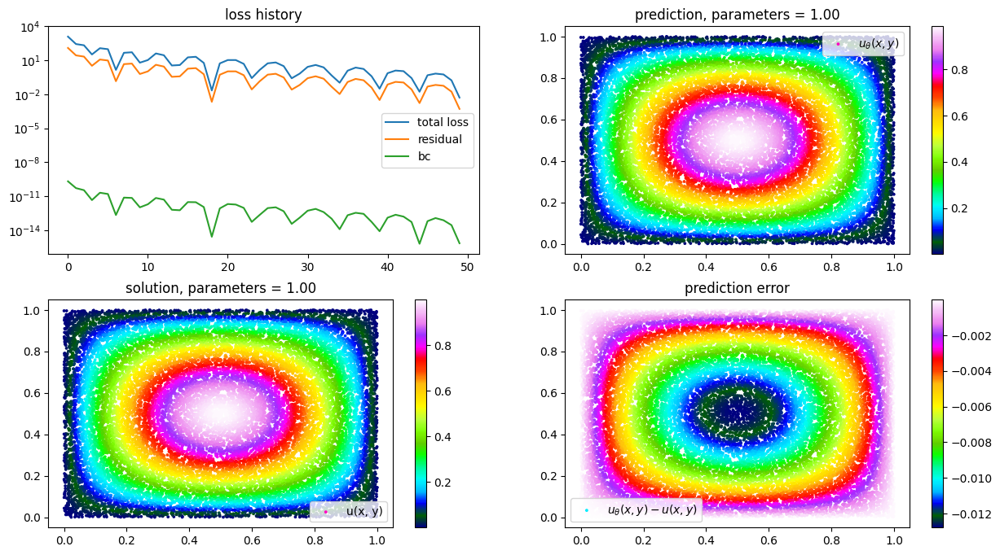

                          0
0  cfpdes.expr.grad_u_exact
1           cfpdes.expr.rhs
2       cfpdes.expr.u_exact
3          cfpdes.poisson.u
Number of features in coordinates: 3
Number of points: 517

Nodes from export.case: [[0.82477343 0.04606718]
 [0.8300841  0.10191753]
 [0.7806651  0.09123866]
 ...
 [0.8390992  0.3016979 ]
 [0.8367227  0.1427201 ]
 [0.7476512  0.5844005 ]]

Feel++ solution 'cfpdes.poisson.u':
[7.53812119e-02 1.60510421e-01 1.79705009e-01 1.74570844e-01
 2.54986346e-01 1.27722591e-01 3.20028135e-18 1.12742715e-01
 1.15302287e-01 1.11077517e-01 1.12572171e-01 6.16604086e-18
 2.13945612e-01 8.42545852e-02 8.70735347e-02 8.11214894e-02
 3.02912369e-02 5.34257255e-02 8.13793987e-02 1.16207786e-01
 2.58669704e-01 2.68487602e-01 2.60586292e-01 4.03792828e-01
 4.04036999e-01 3.27660084e-01 2.10968629e-01 2.40978599e-01
 2.56602913e-01 3.67851049e-01 1.30374357e-01 1.08522445e-01
 3.99112135e-01 2.66314566e-01 1.54342234e-01 2.63949245e-01
 1.29602283e-01 1.06826574e-01 2.0

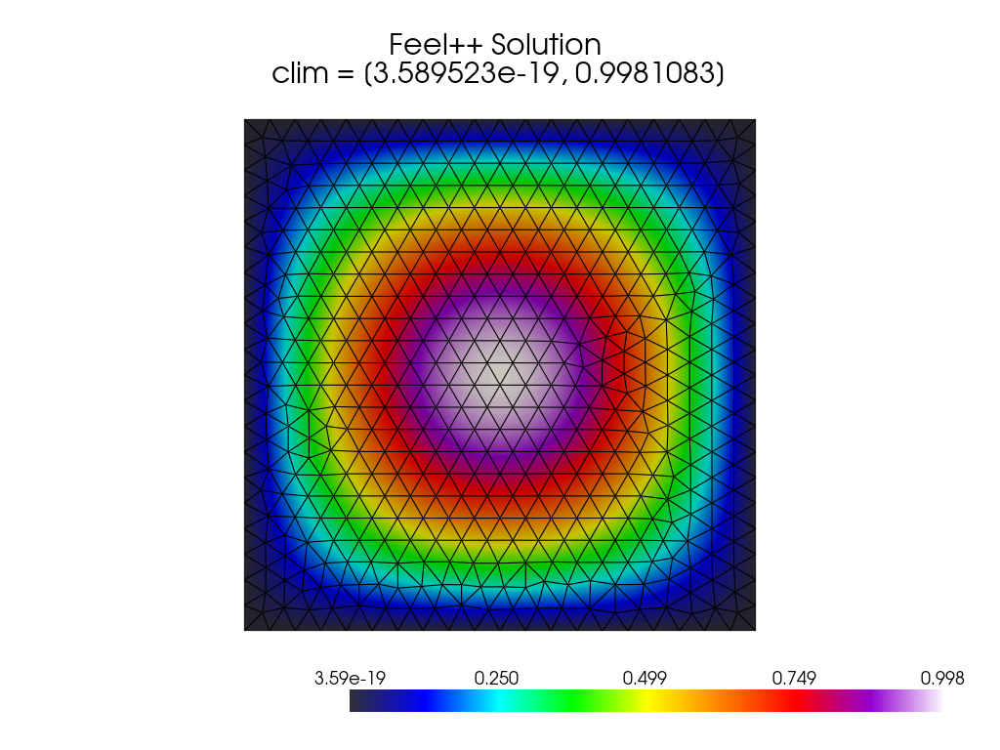

clim scimba =  [0.0, 0.9853551970870282]


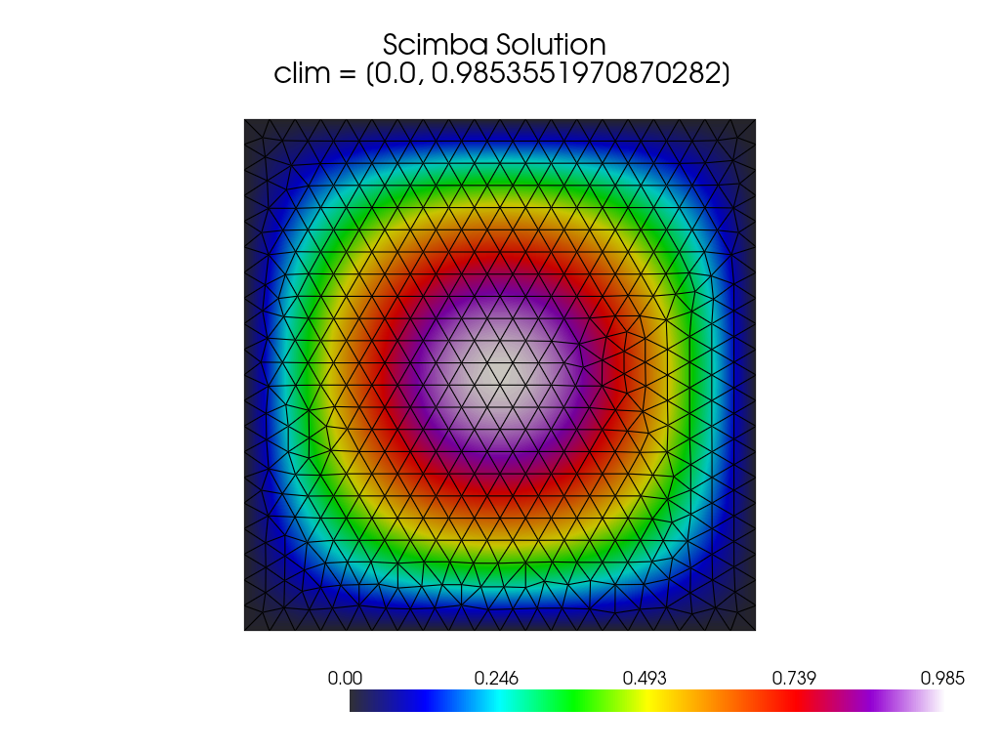

clim exact =  [9.640556e-35, 0.99810165]


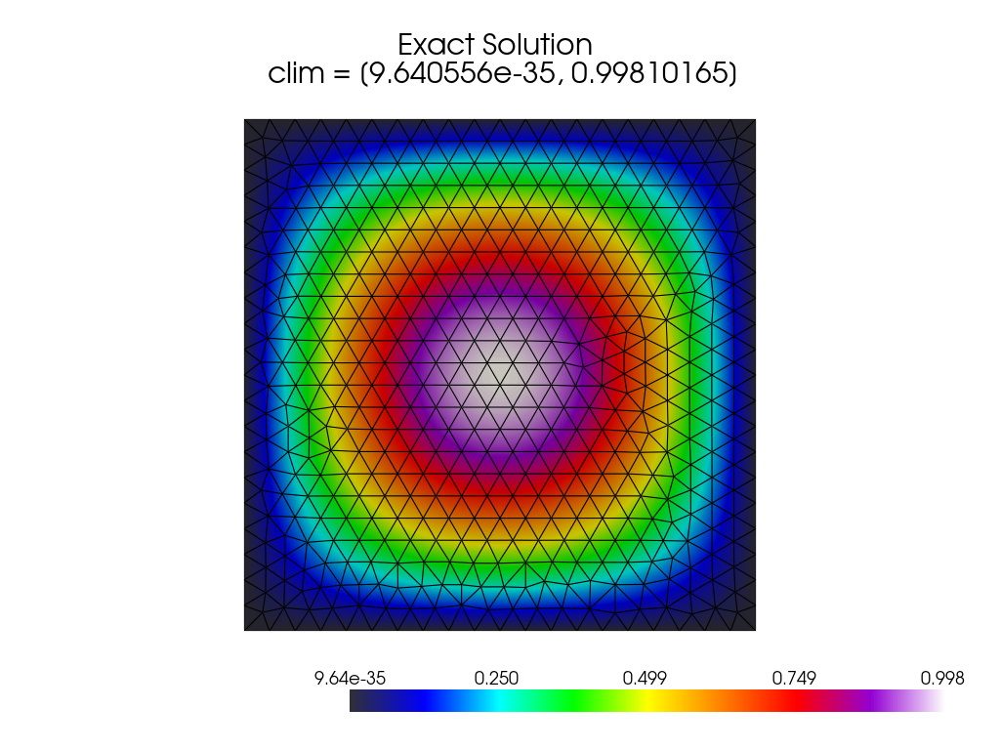

clim err_feel = |u_feel - u_exact|/|u_exact| ∈  [0.0, 7609785000000000.0]


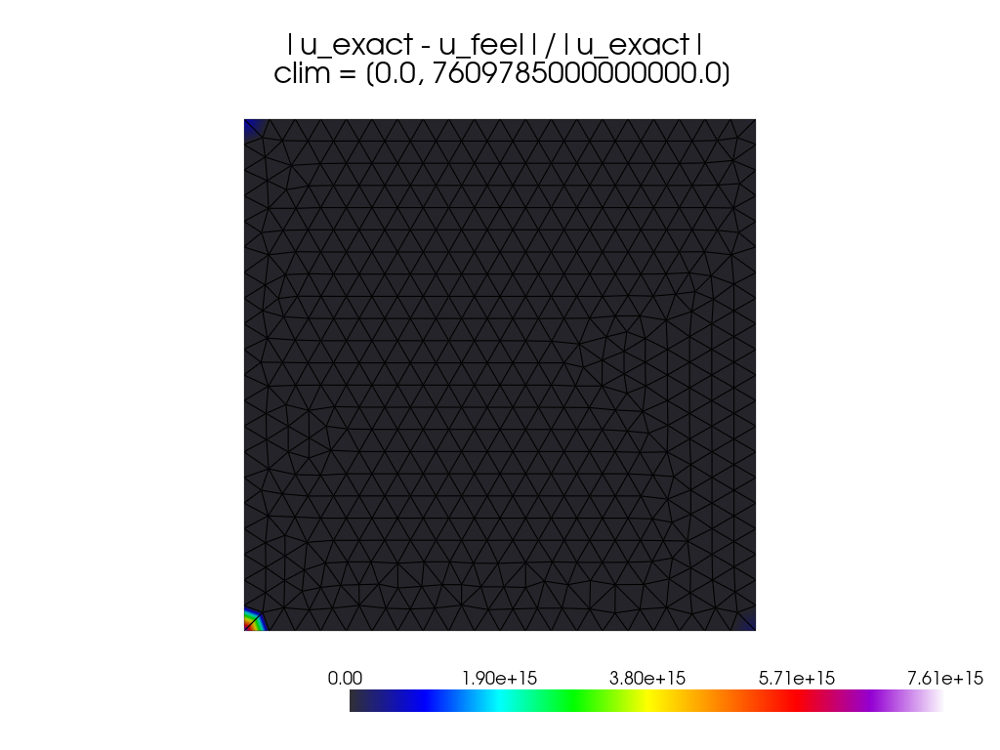

clim err_scimba = |u_scimba - u_exact|/|u_exact| ∈  [0.01276037479808736, 1.0]


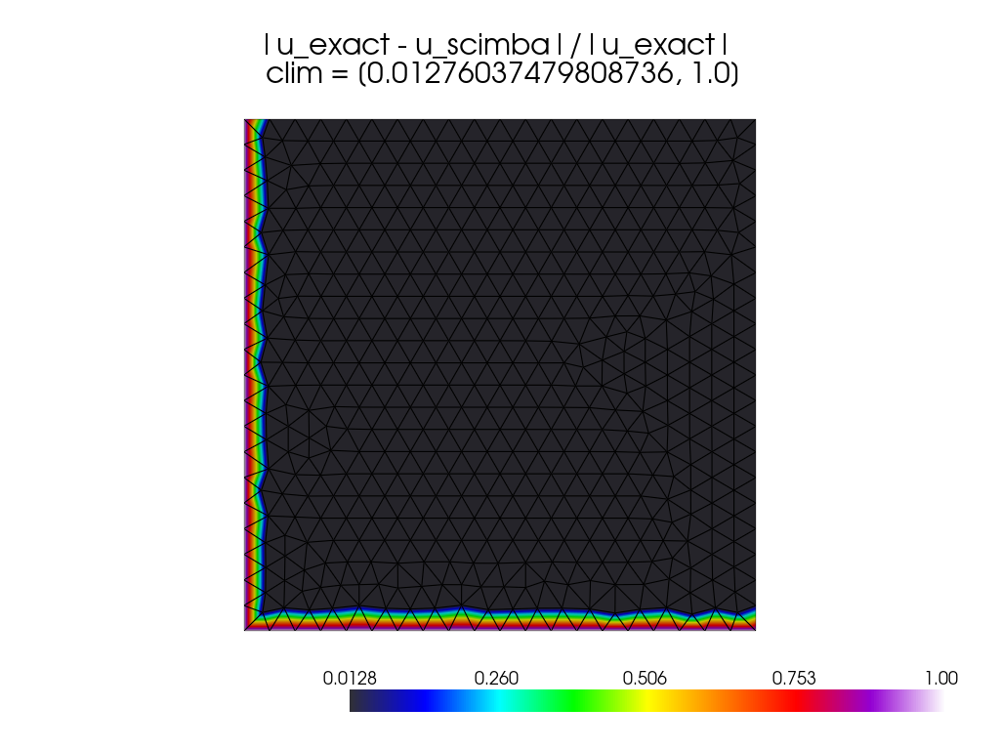

 ||u_feel - u_exact||∞ =  0.0009688735
 ||u_scimba - u_exact||∞ =  0.01274645458152035
Solving the laplacian problem for h = 0.05...
generate mesh omega-2.geo with h=0.05 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.05 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +---------------------------------------------------------------------------------------------------

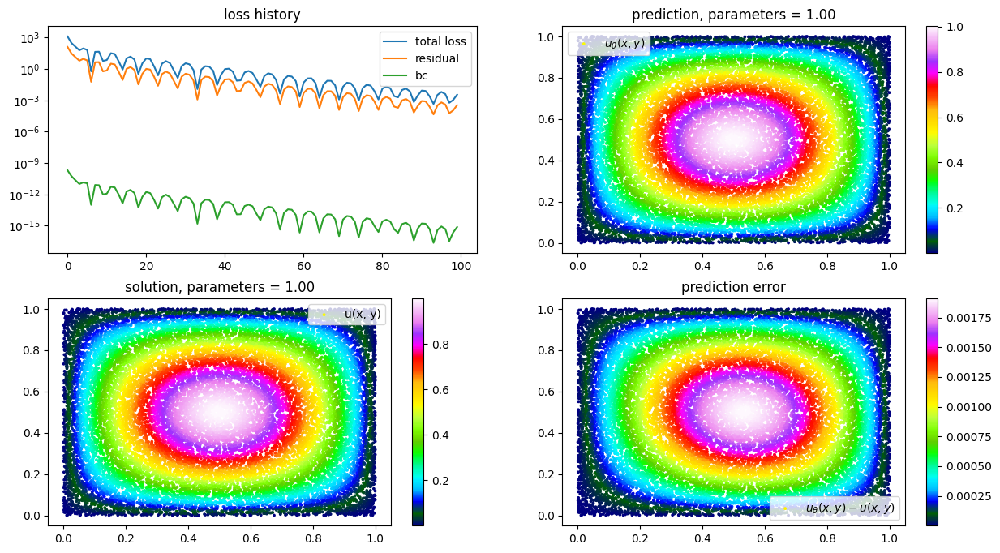

                          0
0  cfpdes.expr.grad_u_exact
1           cfpdes.expr.rhs
2       cfpdes.expr.u_exact
3          cfpdes.poisson.u
Number of features in coordinates: 3
Number of points: 517

Nodes from export.case: [[0.82477343 0.04606718]
 [0.8300841  0.10191753]
 [0.7806651  0.09123866]
 ...
 [0.8390992  0.3016979 ]
 [0.8367227  0.1427201 ]
 [0.7476512  0.5844005 ]]

Feel++ solution 'cfpdes.poisson.u':
[7.53812119e-02 1.60510421e-01 1.79705009e-01 1.74570844e-01
 2.54986346e-01 1.27722591e-01 3.20028135e-18 1.12742715e-01
 1.15302287e-01 1.11077517e-01 1.12572171e-01 6.16604086e-18
 2.13945612e-01 8.42545852e-02 8.70735347e-02 8.11214894e-02
 3.02912369e-02 5.34257255e-02 8.13793987e-02 1.16207786e-01
 2.58669704e-01 2.68487602e-01 2.60586292e-01 4.03792828e-01
 4.04036999e-01 3.27660084e-01 2.10968629e-01 2.40978599e-01
 2.56602913e-01 3.67851049e-01 1.30374357e-01 1.08522445e-01
 3.99112135e-01 2.66314566e-01 1.54342234e-01 2.63949245e-01
 1.29602283e-01 1.06826574e-01 2.0

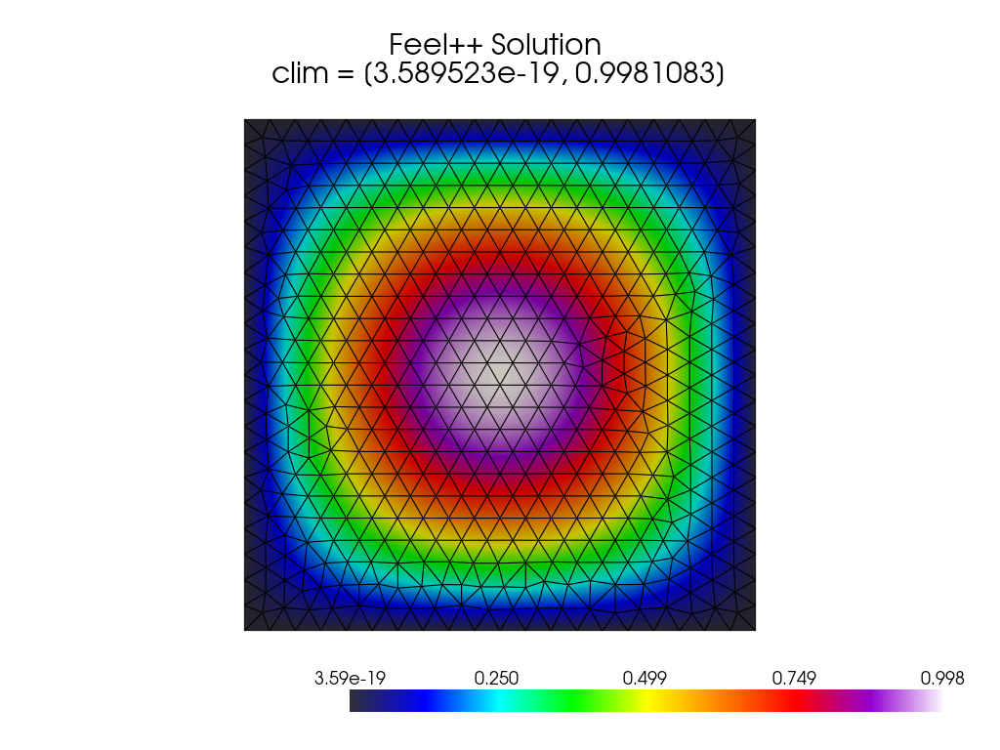

clim scimba =  [0.0, 0.9999937391289901]


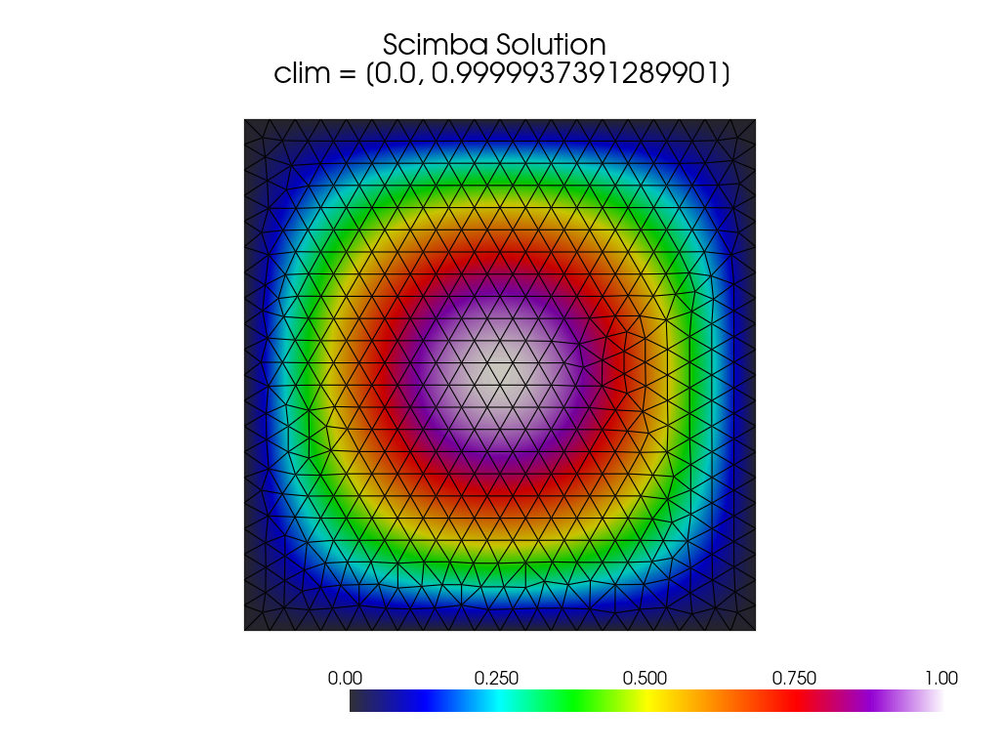

clim exact =  [9.640556e-35, 0.99810165]


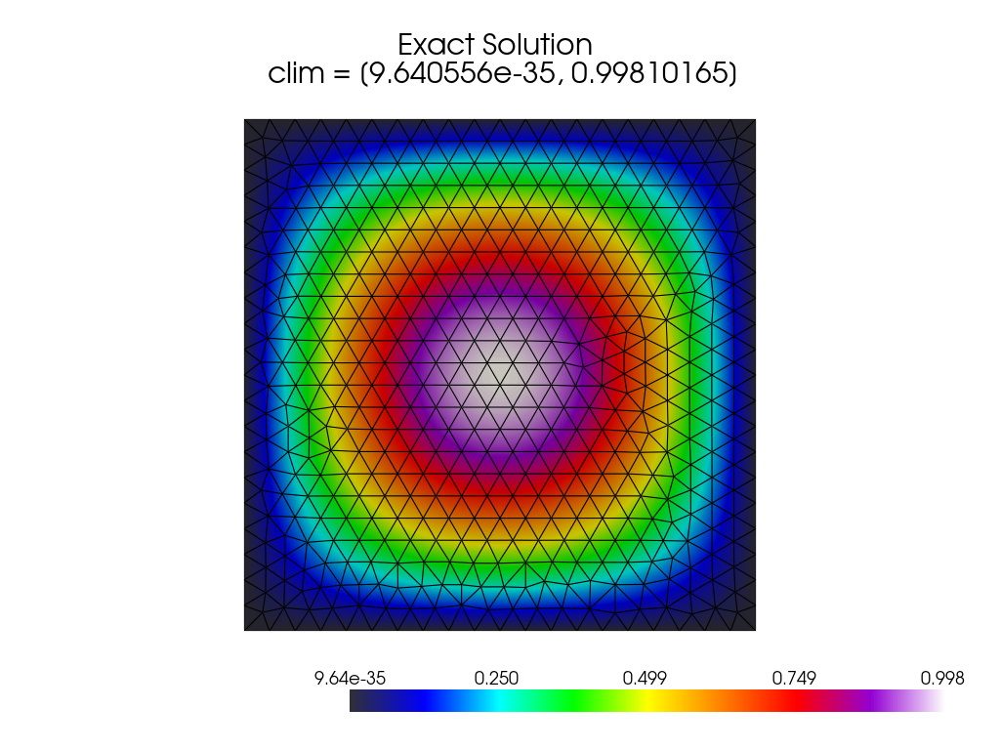

clim err_feel = |u_feel - u_exact|/|u_exact| ∈  [0.0, 7609785000000000.0]


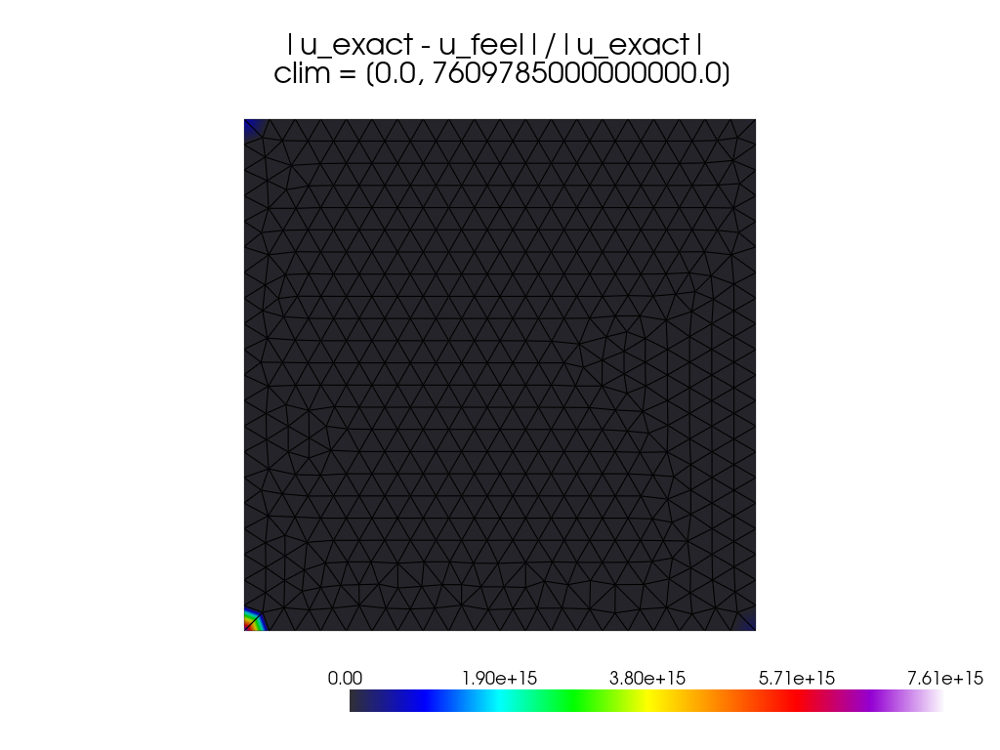

clim err_scimba = |u_scimba - u_exact|/|u_exact| ∈  [0.000653361080968376, 1.0]


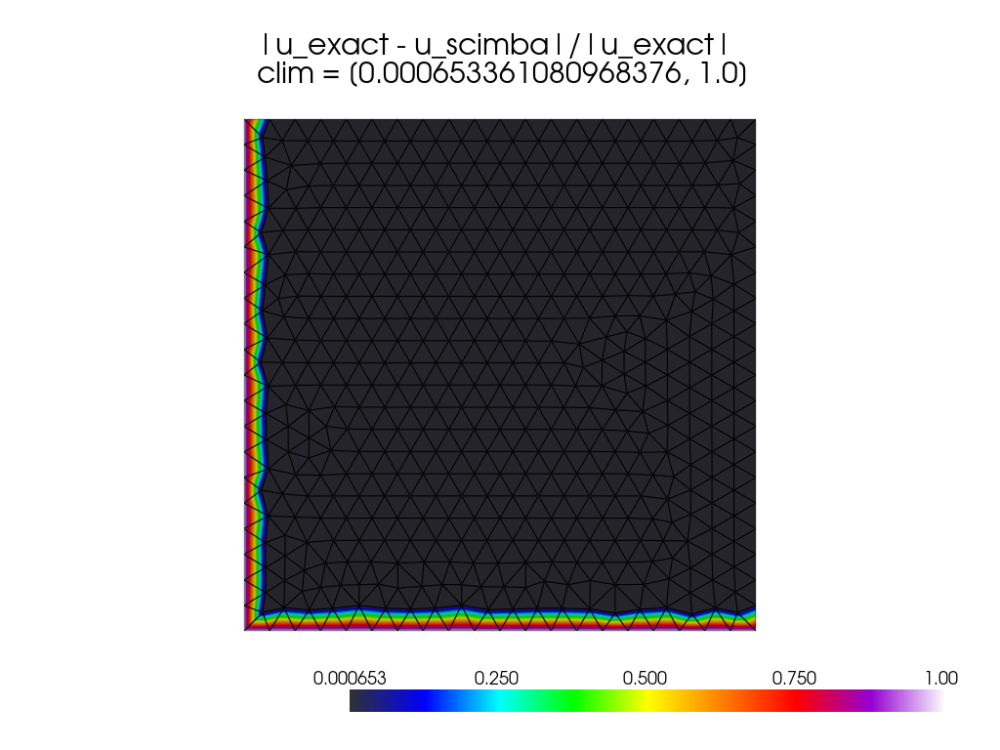

 ||u_feel - u_exact||∞ =  0.0009688735
 ||u_scimba - u_exact||∞ =  0.0019035041757269333
Solving the laplacian problem for h = 0.05...
generate mesh omega-2.geo with h=0.05 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.05 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +-------------------------------------------------------------------------------------------------

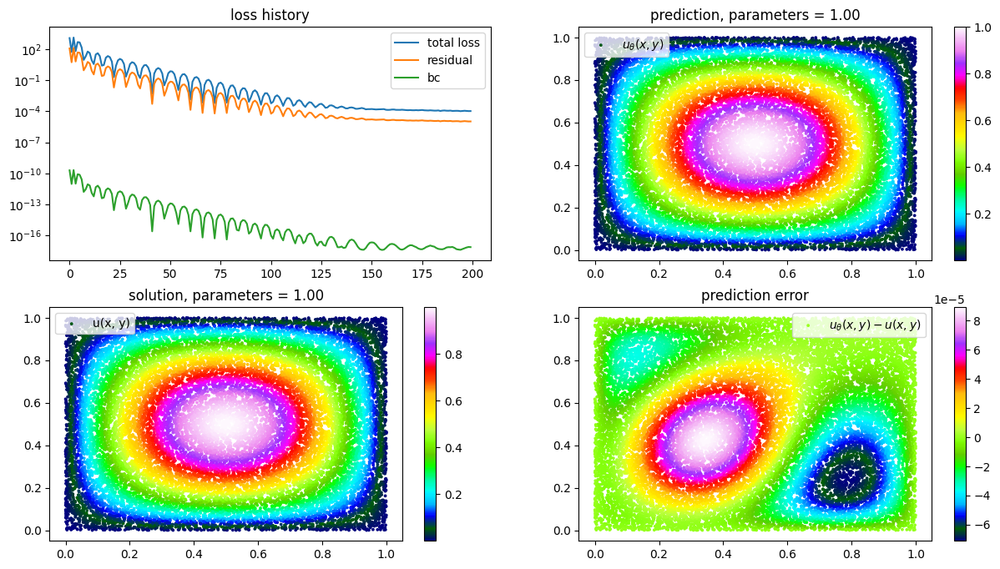

                          0
0  cfpdes.expr.grad_u_exact
1           cfpdes.expr.rhs
2       cfpdes.expr.u_exact
3          cfpdes.poisson.u
Number of features in coordinates: 3
Number of points: 517

Nodes from export.case: [[0.82477343 0.04606718]
 [0.8300841  0.10191753]
 [0.7806651  0.09123866]
 ...
 [0.8390992  0.3016979 ]
 [0.8367227  0.1427201 ]
 [0.7476512  0.5844005 ]]

Feel++ solution 'cfpdes.poisson.u':
[7.53812119e-02 1.60510421e-01 1.79705009e-01 1.74570844e-01
 2.54986346e-01 1.27722591e-01 3.20028135e-18 1.12742715e-01
 1.15302287e-01 1.11077517e-01 1.12572171e-01 6.16604086e-18
 2.13945612e-01 8.42545852e-02 8.70735347e-02 8.11214894e-02
 3.02912369e-02 5.34257255e-02 8.13793987e-02 1.16207786e-01
 2.58669704e-01 2.68487602e-01 2.60586292e-01 4.03792828e-01
 4.04036999e-01 3.27660084e-01 2.10968629e-01 2.40978599e-01
 2.56602913e-01 3.67851049e-01 1.30374357e-01 1.08522445e-01
 3.99112135e-01 2.66314566e-01 1.54342234e-01 2.63949245e-01
 1.29602283e-01 1.06826574e-01 2.0

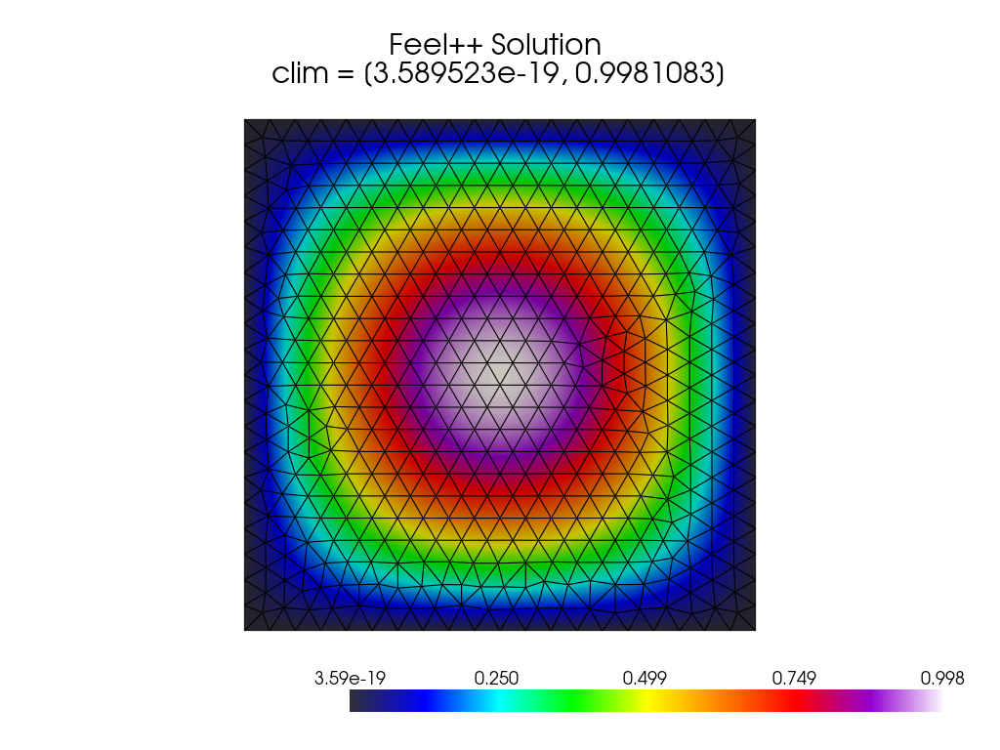

clim scimba =  [0.0, 0.9981575876571868]


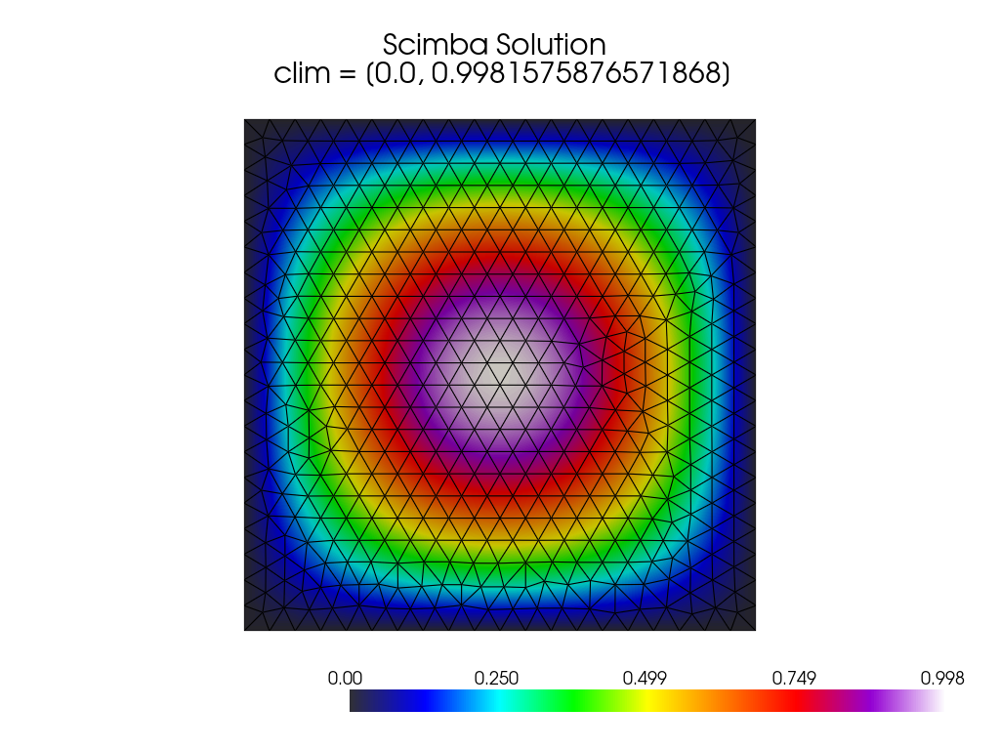

clim exact =  [9.640556e-35, 0.99810165]


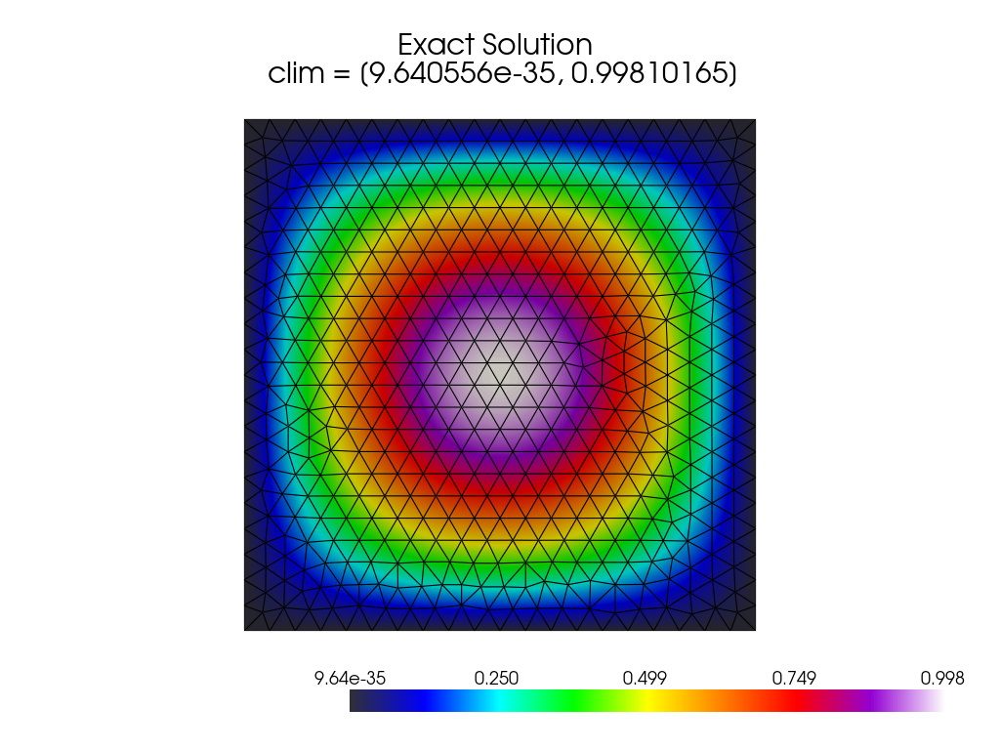

clim err_feel = |u_feel - u_exact|/|u_exact| ∈  [0.0, 7609785000000000.0]


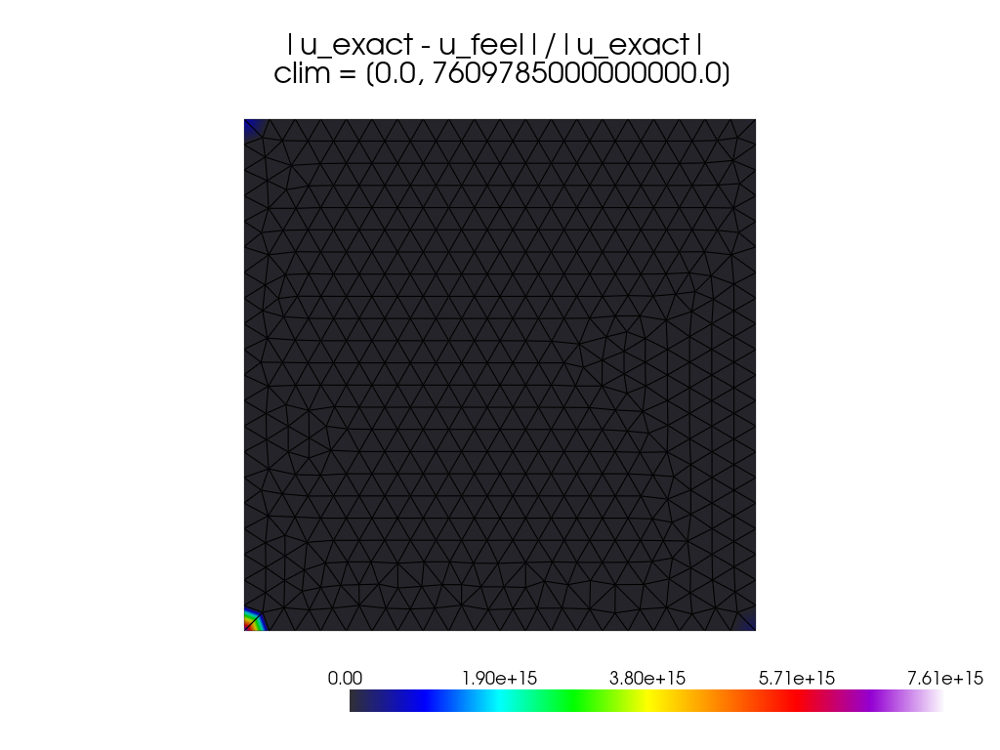

clim err_scimba = |u_scimba - u_exact|/|u_exact| ∈  [1.1739332398176212e-09, 1.0]


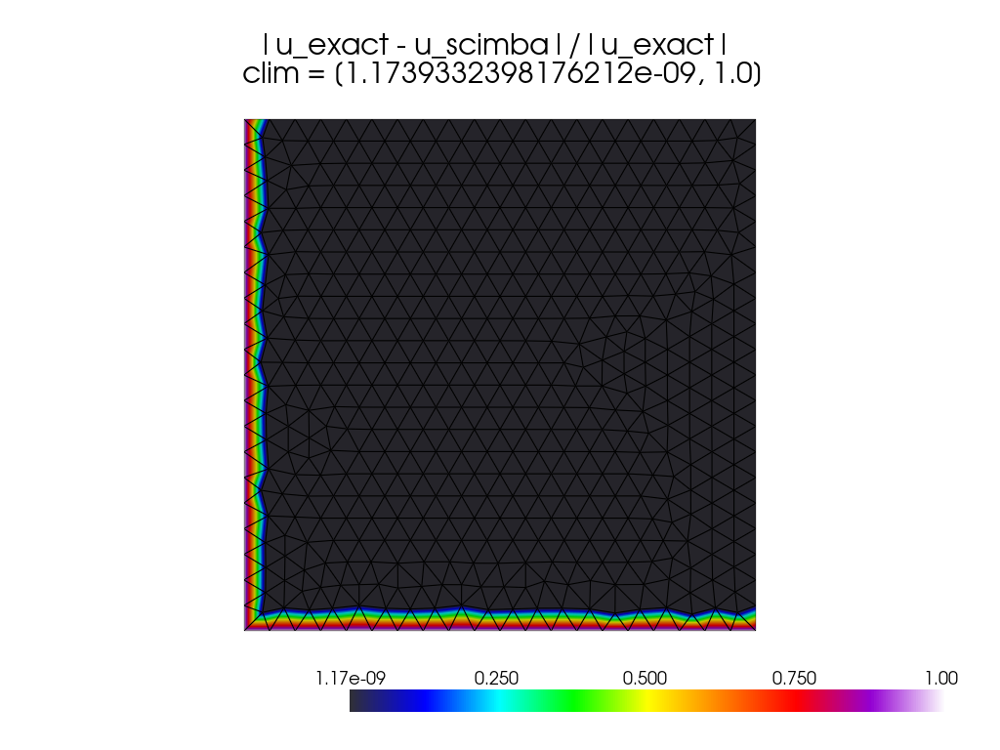

 ||u_feel - u_exact||∞ =  0.0009688735
 ||u_scimba - u_exact||∞ =  8.869281589618527e-05
Solving the laplacian problem for h = 0.05...
generate mesh omega-2.geo with h=0.05 and dimension=2
[loadMesh] Loading mesh in format geo+msh: "/home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo"
[loadMesh] Use default geo desc: /home/u4/csmi/2024/sarr/feelpp-scimba/notebooks/feelppdb/feelpp_cfpde/np_1/omega-2.geo 0.05 
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| Toolbox::cfpdes-2d-p1 - Use Case Study                                                                                                             |
+----------------------------------------------------------------------------------------------------------------------------------------------------+
| +-------------------------------------------------------------------------------------------------

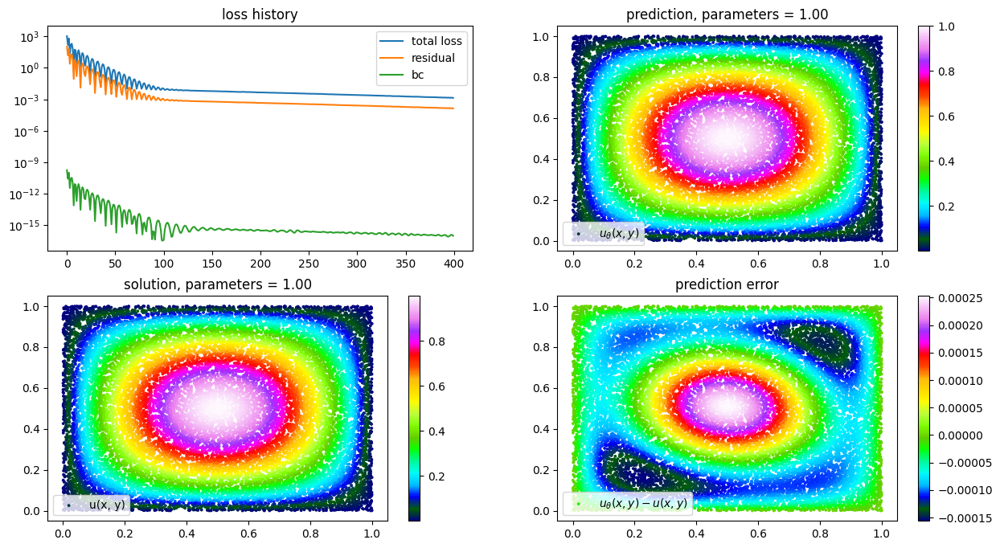

                          0
0  cfpdes.expr.grad_u_exact
1           cfpdes.expr.rhs
2       cfpdes.expr.u_exact
3          cfpdes.poisson.u
Number of features in coordinates: 3
Number of points: 517

Nodes from export.case: [[0.82477343 0.04606718]
 [0.8300841  0.10191753]
 [0.7806651  0.09123866]
 ...
 [0.8390992  0.3016979 ]
 [0.8367227  0.1427201 ]
 [0.7476512  0.5844005 ]]

Feel++ solution 'cfpdes.poisson.u':
[7.53812119e-02 1.60510421e-01 1.79705009e-01 1.74570844e-01
 2.54986346e-01 1.27722591e-01 3.20028135e-18 1.12742715e-01
 1.15302287e-01 1.11077517e-01 1.12572171e-01 6.16604086e-18
 2.13945612e-01 8.42545852e-02 8.70735347e-02 8.11214894e-02
 3.02912369e-02 5.34257255e-02 8.13793987e-02 1.16207786e-01
 2.58669704e-01 2.68487602e-01 2.60586292e-01 4.03792828e-01
 4.04036999e-01 3.27660084e-01 2.10968629e-01 2.40978599e-01
 2.56602913e-01 3.67851049e-01 1.30374357e-01 1.08522445e-01
 3.99112135e-01 2.66314566e-01 1.54342234e-01 2.63949245e-01
 1.29602283e-01 1.06826574e-01 2.0

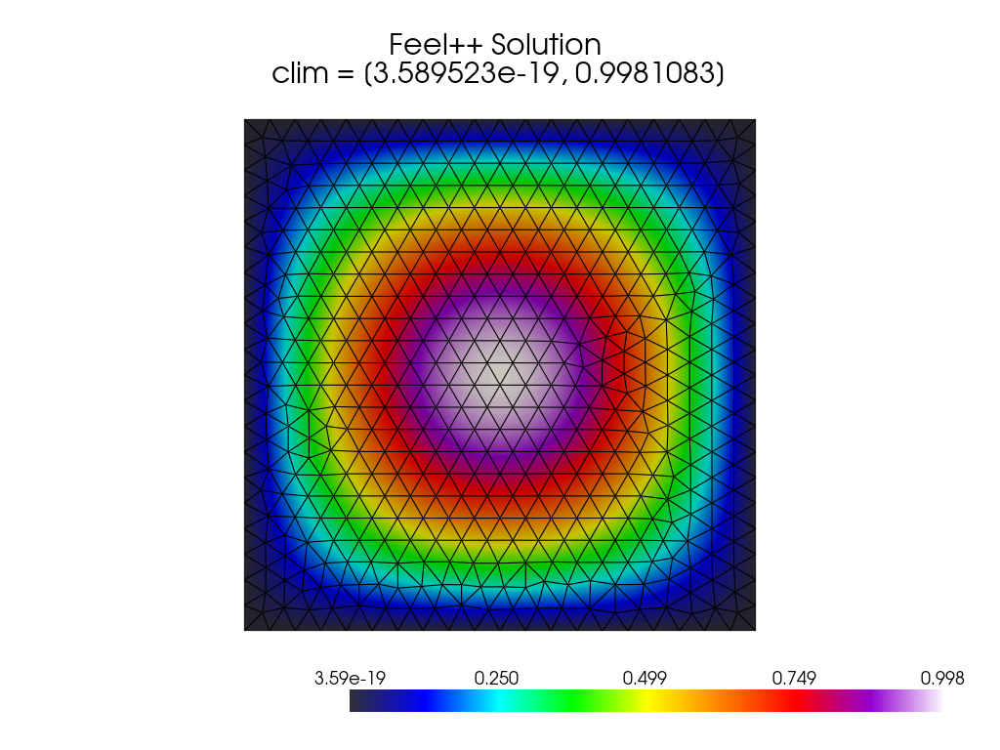

clim scimba =  [0.0, 0.998351119427428]


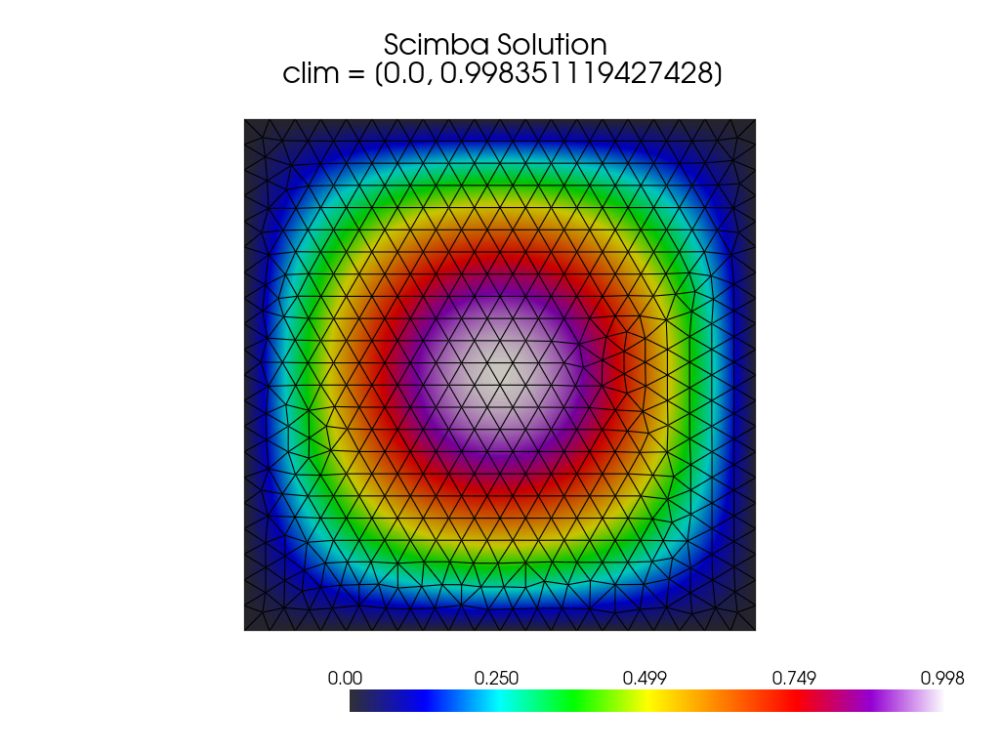

clim exact =  [9.640556e-35, 0.99810165]


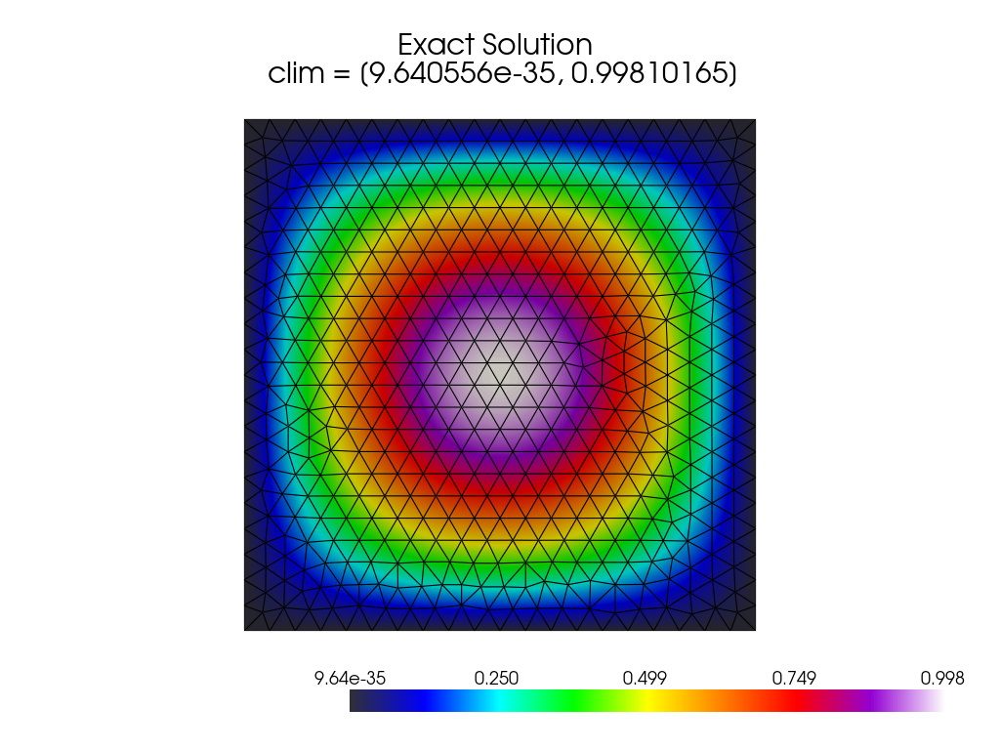

clim err_feel = |u_feel - u_exact|/|u_exact| ∈  [0.0, 7609785000000000.0]


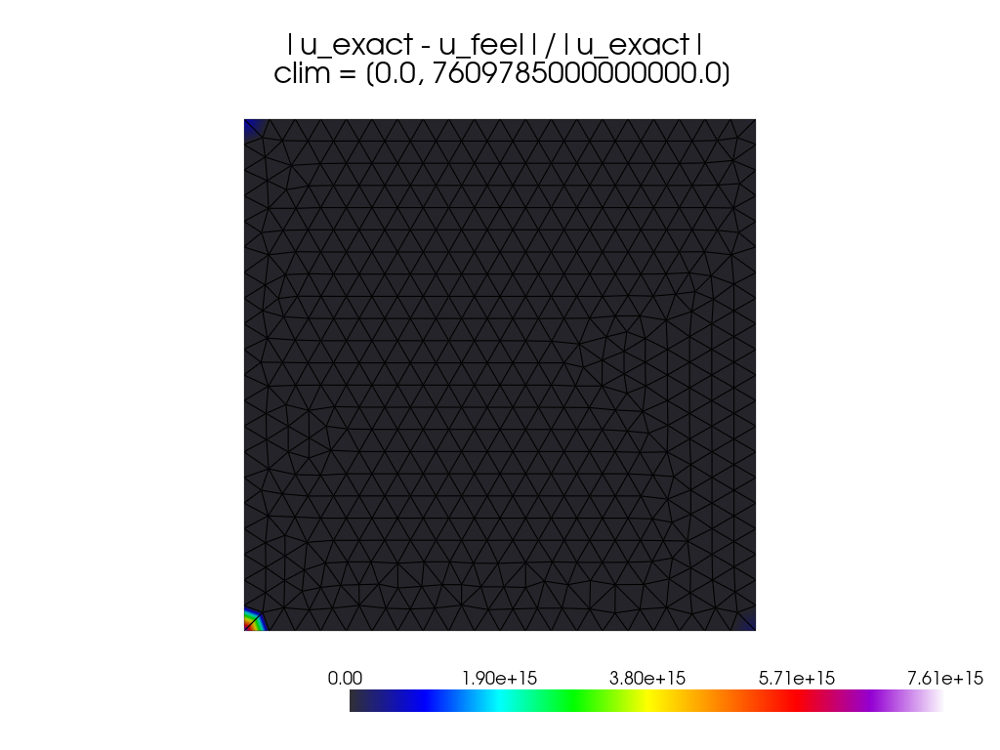

clim err_scimba = |u_scimba - u_exact|/|u_exact| ∈  [2.502928746727261e-06, 1.0]


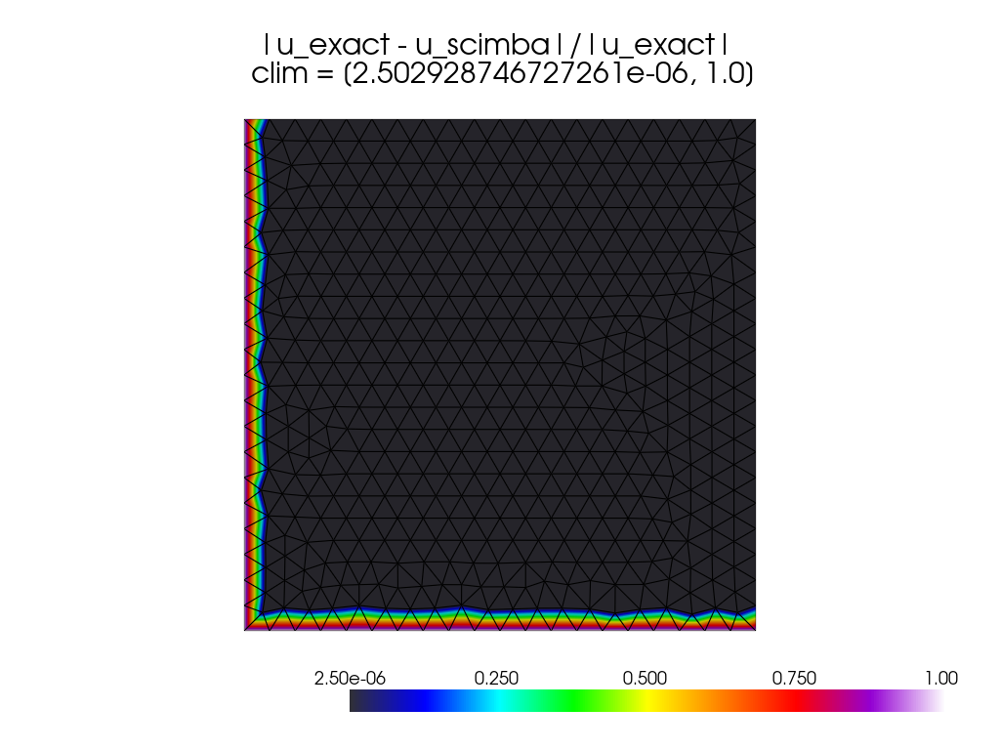

 ||u_feel - u_exact||∞ =  0.0009688735
 ||u_scimba - u_exact||∞ =  0.0002505233391716377
[0.013201552217419494, 0.0018383789741783867, 6.785068556007055e-05, 0.00019277459698586113]


In [3]:
u_exact = 'sin(pi*x) * sin(pi*y)'
grad_u_exact='{pi*cos(pi*x)*sin(pi*y),pi*sin(pi*x)*cos(pi*y)}'
rhs = '2*pi*pi*sin(pi*x) * sin(pi*y)'

scimba_errors = []
nb_coll= [500,1000,2000,4000]

for i in nb_coll:
  P( rhs=rhs, g='0', plot=None ,solver='scimba',  u_exact = u_exact,grad_u_exact=grad_u_exact,nb_coll=i)
  scimba_errors.append(P.errl2_scimba)
print(scimba_errors)

In [4]:
df_scimba = pd.DataFrame({'nb_coll': nb_coll, 'Scimba_L2_error': scimba_errors})
df_scimba['convergence_rate'] = np.log2(df_scimba['Scimba_L2_error'].shift() / df_scimba['Scimba_L2_error']) / np.log2(df_scimba['nb_coll'].shift() / df_scimba['nb_coll'])

fig = plot_scimba_convergence(df_scimba)
fig.show()